In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

In [2]:
data=pd.read_csv("D:\\CVIP\complete.csv")

In [3]:
data.head(n=2)

,Date,Name of State / UT,Latitude,Longitude,Total Confirmed cases,Death,Cured/Discharged/Migrated,New cases,New deaths,New recovered
0,2020-01-30,Kerala,10.8505,76.2711,1.0,0,0.0,0,0,0
1,2020-01-31,Kerala,10.8505,76.2711,1.0,0,0.0,0,0,0


In [4]:
data.shape

(4692, 10)

In [5]:
data.dtypes

Date                          object
Name of State / UT            object
Latitude                     float64
Longitude                    float64
Total Confirmed cases        float64
Death                         object
Cured/Discharged/Migrated    float64
New cases                      int64
New deaths                     int64
New recovered                  int64
dtype: object

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4692 entries, 0 to 4691
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       4692 non-null   object 
 1   Name of State / UT         4692 non-null   object 
 2   Latitude                   4692 non-null   float64
 3   Longitude                  4692 non-null   float64
 4   Total Confirmed cases      4692 non-null   float64
 5   Death                      4692 non-null   object 
 6   Cured/Discharged/Migrated  4692 non-null   float64
 7   New cases                  4692 non-null   int64  
 8   New deaths                 4692 non-null   int64  
 9   New recovered              4692 non-null   int64  
dtypes: float64(4), int64(3), object(3)
memory usage: 366.7+ KB


In [7]:
print(f"Total Memory Being Used in KB :{(data.memory_usage(deep=True).sum()/1024)}")

Total Memory Being Used in KB :1141.537109375


In [8]:
data.isna().sum() # Data is Clean

Date                         0
Name of State / UT           0
Latitude                     0
Longitude                    0
Total Confirmed cases        0
Death                        0
Cured/Discharged/Migrated    0
New cases                    0
New deaths                   0
New recovered                0
dtype: int64

In [9]:
data.duplicated().sum() # DATA IS PURE

0

In [10]:
data["Name of State / UT"].value_counts()

Kerala                                      186
Delhi                                       154
Rajasthan                                   152
Uttar Pradesh                               152
Haryana                                     152
Tamil Nadu                                  149
Punjab                                      147
Karnataka                                   147
Maharashtra                                 147
Andhra Pradesh                              144
Uttarakhand                                 141
Odisha                                      140
Puducherry                                  138
Chhattisgarh                                137
Gujarat                                     136
Ladakh                                      135
Jammu and Kashmir                           135
Himachal Pradesh                            135
Madhya Pradesh                              135
Chandigarh                                  135
Bihar                                   

In [11]:
data.loc[data["Name of State / UT"]=="Telangana***",]

,Date,Name of State / UT,Latitude,Longitude,Total Confirmed cases,Death,Cured/Discharged/Migrated,New cases,New deaths,New recovered
4303,2020-07-26,Telangana***,0.0,0.0,52466.0,455,40334.0,0,0,0


In [12]:
data.loc[data["Name of State / UT"]=="Telangana***","Name of State / UT"]="Telangana"

In [13]:
# TOTAL CONFIRMED COVID CASES IN EACH STATE

In [14]:
plt.figure(figsize=(40,40))
px.bar(data,x=data["Name of State / UT"],y="Total Confirmed cases",text="Total Confirmed cases",color="Name of State / UT",orientation='v',title="Chart Representing Number of Active Cases In Each State")

<Figure size 4000x4000 with 0 Axes>

In [15]:
pd.to_numeric(data["Death"])

ValueError: Unable to parse string "0#" at position 2241

In [16]:
data.loc[data["Death"]=="0#",:]

,Date,Name of State / UT,Latitude,Longitude,Total Confirmed cases,Death,Cured/Discharged/Migrated,New cases,New deaths,New recovered
2241,2020-05-24,Puducherry,11.9416,79.8083,26.0,0#,10.0,0,0,0


In [17]:
data.drop(2241,axis=0,inplace=True)

In [18]:
data["Death"]=data["Death"].astype(int) #CONVERTING TO INTEGERS

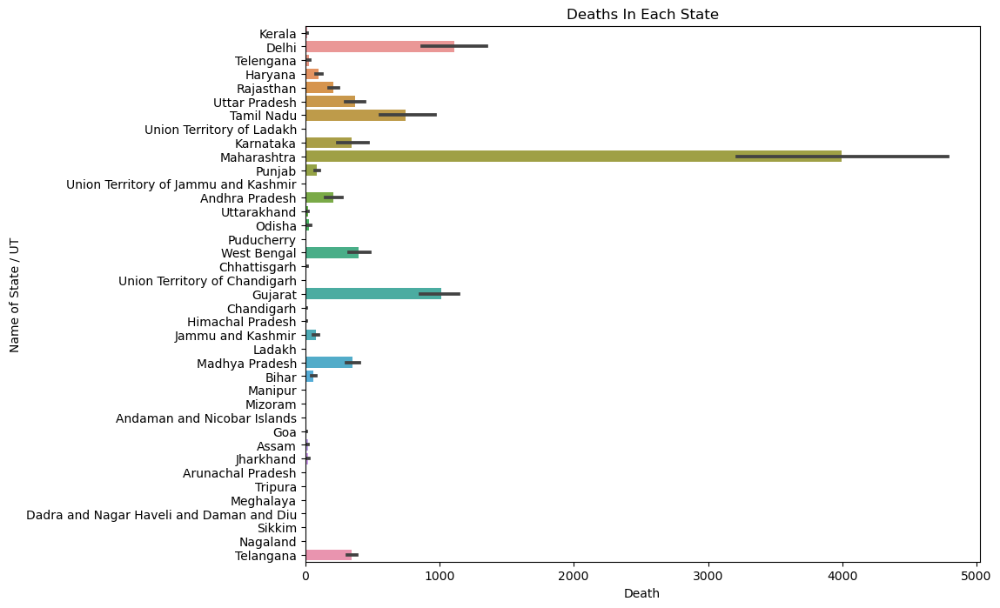

In [19]:
plt.figure(figsize=(10,8))
sns.barplot(data=data,y="Name of State / UT",x="Death",orientation='horizontal')
plt.title("Deaths In Each State")
plt.show()

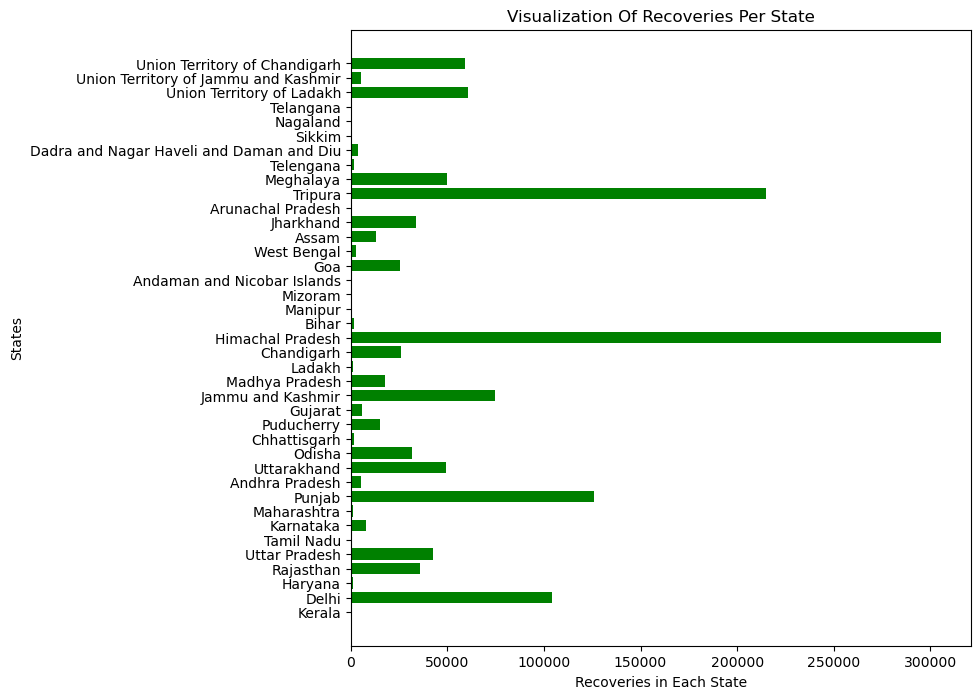

In [20]:
plt.figure(figsize=(8,8))
plt.barh(data["Name of State / UT"].value_counts().index,data.groupby('Name of State / UT').sum()['New recovered'],color='g',label=data["Name of State / UT"].value_counts().index)
plt.xlabel('Recoveries in Each State')
plt.ylabel('States')
plt.title('Visualization Of Recoveries Per State')
#plt.legend(loc='')
plt.show()

# DATE TIME ANALYSIS

In [21]:
data["Month"]=(data["Date"].apply(lambda x:x.split('-')[1])).astype(int)

In [22]:
#Deaths In Each Month

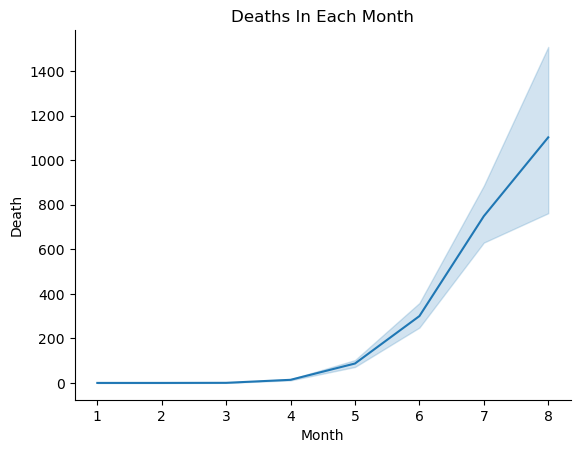

In [23]:
sns.lineplot(data=data,x="Month",y='Death')
plt.title('Deaths In Each Month')
sns.despine()

In [24]:
# TOTAL CONFIRMED CASES IN EACH MONTH
data.groupby('Month').sum()['Total Confirmed cases']

Month
1           2.0
2          86.0
3        9385.0
4      414702.0
5     2899619.0
6     9836800.0
7    29320736.0
8    10978941.0
Name: Total Confirmed cases, dtype: float64

(1000000.0, 40000000.0)

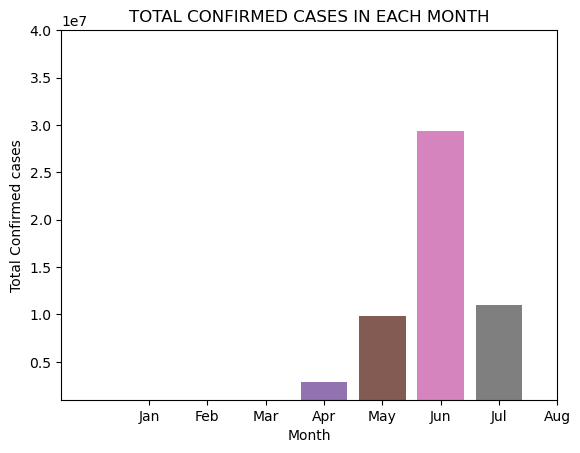

In [25]:
sns.barplot(y=data.groupby('Month').sum()['Total Confirmed cases'],x=data.groupby('Month').sum().index)
plt.xticks(data.groupby('Month').sum().index,['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'])#,'Sept','Oct','Nov','Dec'])
plt.title('TOTAL CONFIRMED CASES IN EACH MONTH')
plt.ylim(1000000,40000000)

IN JUNE THERE ARE MOST ACTIVE CASES.

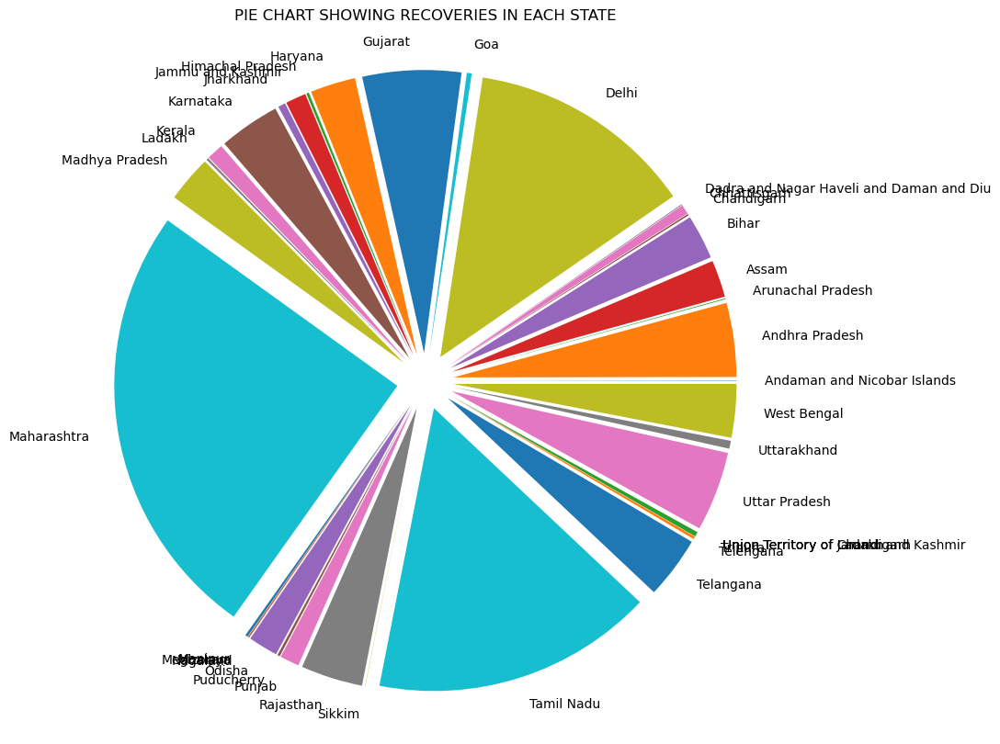

In [26]:
plt.figure(figsize=(10,10))
plt.title('PIE CHART SHOWING RECOVERIES IN EACH STATE')
plt.pie(data.groupby("Name of State / UT")['Cured/Discharged/Migrated'].sum(),labels=data.groupby("Name of State / UT").sum().index,explode=[0.1]*(len(data["Name of State / UT"].value_counts().index)))
plt.show()

In [27]:
states=(data.groupby('Name of State / UT')["Total Confirmed cases"].sum()-data.groupby('Name of State / UT')["Cured/Discharged/Migrated"].sum()).index

In [28]:
tot_c=data.groupby('Name of State / UT')["Total Confirmed cases"].sum()#--

In [29]:
tot_r=data.groupby('Name of State / UT')["Cured/Discharged/Migrated"].sum()

In [30]:
tot_d=data.groupby('Name of State / UT')["Death"].sum()

<BarContainer object of 39 artists>

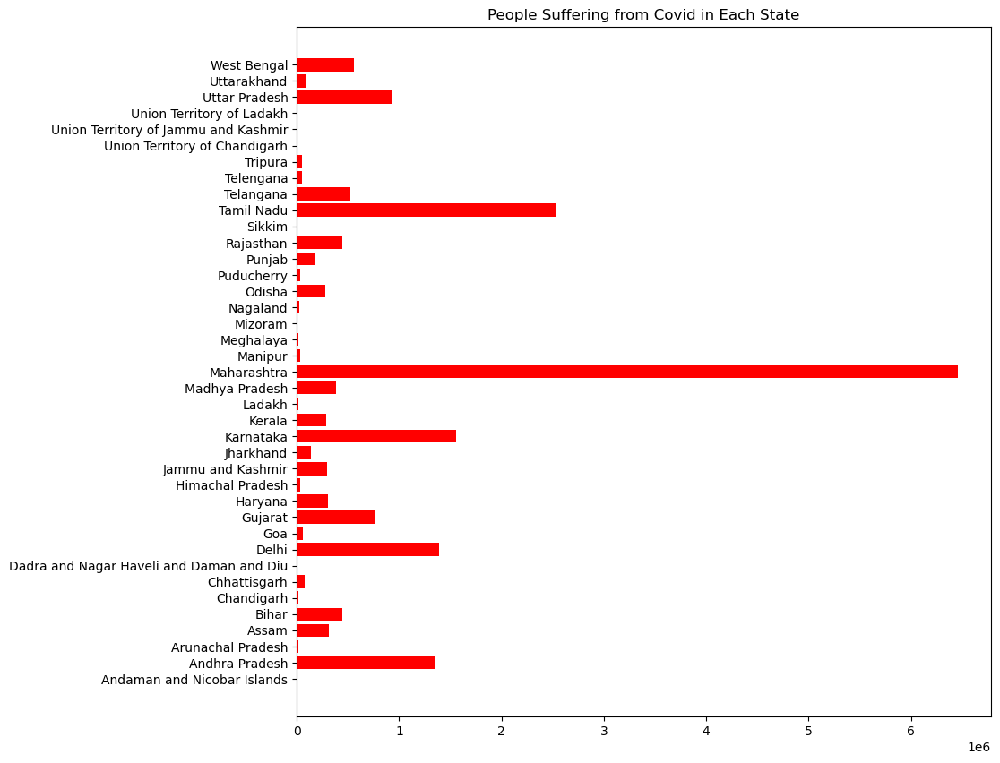

In [31]:
plt.figure(figsize=(10,10))
plt.title("People Suffering from Covid in Each State") #DEPICTS THE PERCENTAGE OF PEOPLE SUFFERING FROM COVID IN EACH STATE.
plt.barh(states,tot_c-tot_r-tot_d,color='r')

<AxesSubplot:xlabel='Month', ylabel='New cases'>

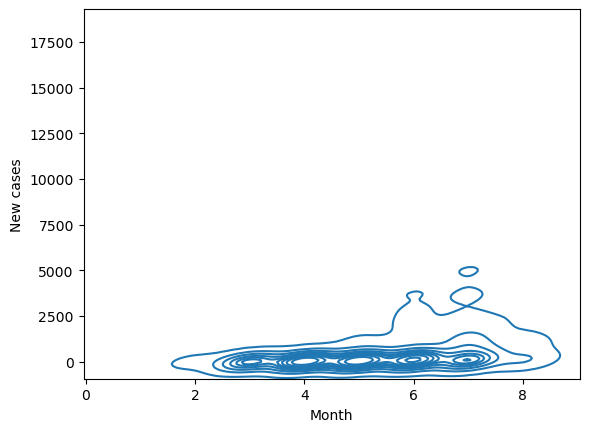

In [32]:
sns.kdeplot(data=data,x="Month",y="New cases")

<AxesSubplot:>

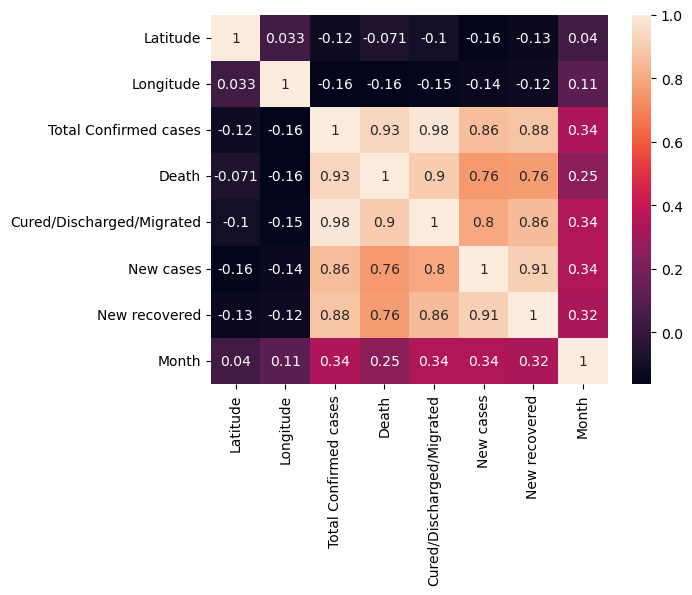

In [33]:
sns.heatmap(data.drop("New deaths",axis=1).corr(),annot=True)

In [34]:
months=data.groupby('Month').mean().index

In [35]:
month=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug']

Text(0, 0.5, 'Total Cases')

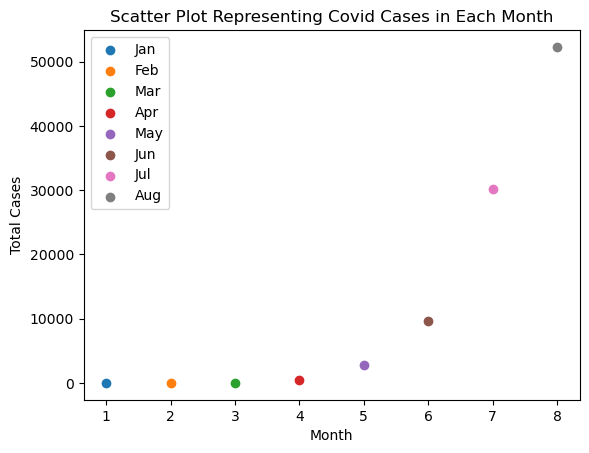

In [36]:
plt.title('Scatter Plot Representing Covid Cases in Each Month')
i=0
for i in range(len(months)):
    plt.scatter(months[i],data.groupby('Month')["Total Confirmed cases"].mean().to_list()[i],label=month[i])
i+=1
plt.xlabel('Month')
plt.legend()
plt.ylabel('Total Cases')

In [37]:
#Covid Cases Increase Monthly and Most in August.

In [48]:
import geopandas as gpd
import folium
from folium import Marker
from folium.plugins import HeatMap,MarkerCluster
from geopy.geocoders import Nominatim
locator = Nominatim(user_agent="kaggle_learn")
India_point = locator.geocode("India").point
India_point

Point(22.3511148, 78.6677428, 0.0)

In [49]:
temp=data.copy()

In [50]:
complete_data = gpd.GeoDataFrame(temp, geometry=gpd.points_from_xy(temp.Latitude,temp.Longitude))
complete_data.crs = {'init':'epsg:4326'}
complete_data.head()

C:\Users\Sathya Sai\anaconda3\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



,Date,Name of State / UT,Latitude,Longitude,Total Confirmed cases,Death,Cured/Discharged/Migrated,New cases,New deaths,New recovered,Month,geometry
0,2020-01-30,Kerala,10.8505,76.2711,1.0,0,0.0,0,0,0,1,POINT (10.85050 76.27110)
1,2020-01-31,Kerala,10.8505,76.2711,1.0,0,0.0,0,0,0,1,POINT (10.85050 76.27110)
2,2020-02-01,Kerala,10.8505,76.2711,2.0,0,0.0,1,0,0,2,POINT (10.85050 76.27110)
3,2020-02-02,Kerala,10.8505,76.2711,3.0,0,0.0,1,0,0,2,POINT (10.85050 76.27110)
4,2020-02-03,Kerala,10.8505,76.2711,3.0,0,0.0,0,0,0,2,POINT (10.85050 76.27110)


In [113]:
from folium.plugins import HeatMap
m=folium.Map(location=[India_point.latitude,India_point.longitude],tiles="stamentoner",zoom_start=5)
j=HeatMap(data=complete_data[['Latitude','Longitude']],radius=15)
m.add_child(j)
m

In [114]:
m=folium.Map(location=[India_point.latitude,India_point.longitude],tiles="cartodbpositron",zoom_start=5)
mc = MarkerCluster()
for itr,row in complete_data.iterrows():
    mc.add_child(Marker([row['Latitude'],row['Longitude']],tooltip=row['Name of State / UT']))
m.add_child(mc)
m

In [115]:
mp=folium.Map(location=[India_point.latitude,India_point.longitude],tiles="cartodbpositron",zoom_start=5)
inc=folium.map.FeatureGroup()
for lat,long,label in zip(data.Latitude,data.Longitude,data['Name of State / UT']):
    inc.add_child(folium.features.CircleMarker([lat,long],popup=label,radius=2))
mp.add_child(inc)

In [130]:
from folium import Choropleth
m_p = folium.Map(location=[India_point.latitude,India_point.longitude], tiles='cartodbpositron', zoom_start=5)

# Add a choropleth map to the base map
Choropleth(geo_data=complete_data['geometry'].__geo_interface__, 
           data=temp.groupby('Name of State / UT')['Total Confirmed cases'].sum(),
           fill_opacity = 0.7,
           line_opacity = .1,
           key_on='feature.id', 
           fill_color='YlGn', 
           legend_name='Total Active Covid cases'
          ).add_to(m_p)
m_p